# General setup

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import chembl_webresource_client
import matplotlib
import numpy as np
import optuna
import pandas as pd
import rdkit
import scipy
import sklearn
import torch
import umap

c:\Users\tarik\anaconda3\envs\mtdnn_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
print(umap.__version__)
print(optuna.__version__)
print(torch.__version__)
print(chembl_webresource_client.__version__)
print(sklearn.__version__)
print(scipy.__version__)
print(matplotlib.__version__)
print(rdkit.__version__)
print(pd.__version__)

0.5.5
3.6.1
2.3.0
0.10.9
1.5.1
1.13.0
3.9.1
2024.03.5
2.2.2


In [4]:
torch.cuda.is_available()

True

In [26]:
torch_device = "cuda"
seed = 42

# First part of the study

This part can be skipped because the datasets have already been retrieved and saved in the data folder

Entire resolute dataset and human protein dataset from UniProt are merged to associate UniProt-IDs with SLC transporters through HUGO identifiers. 

In [5]:
from data_utils import DataFetcher, merge_resolute_with_uniprot

In [6]:
refetch_datasets = False

In [7]:
# Load the resolute and unpirot datasets
resolute_df = pd.read_csv("datasets/1_resolute_db.csv")
uniprot_df = pd.read_table("datasets/2_uniprotkb_human.tsv", delimiter="\t")

In [8]:
# Merge the resolute and uniprot datasets to associate SLC names with corresponding UniProt-IDs
resol_uniprot_merg_df = merge_resolute_with_uniprot(resolute_df, uniprot_df)

# Change if data should be fetched from the ChEMBL-DB, otherwise leave as it is and the data will be loaded locally
if refetch_datasets:
    chembl_df, error_ids = DataFetcher().get_target_by_uniprot(resol_uniprot_merg_df)
    chembl_df.to_csv("datasets/3_raw_chembl_fetch.csv", index=False)
else:
    chembl_df = pd.read_csv("datasets/3_raw_chembl_fetch.csv")

# Second part

Import and stadardization of the dataset.

This ensures consistant relationship between the compound target pairs by maintaining the same activity types, units, filtering of measurements with mutated targets, and removal of duplicates.


In [9]:
from data_utils import filter_mutant_targets, threshold_and_average_activities

In [10]:
# Import the processed dataset with compounds and print the columns.
# Descriptors will be removed after importing and added after additional processing steps to avoid unceccesary memory use.
processed_df = pd.read_csv(
    r"datasets/5_SLC_all_fings.csv",
    low_memory=False,
    usecols=lambda colname: not colname.isdigit(),
)
print("Column names:", processed_df.columns.tolist())

Column names: ['compound_chembl_id', 'assay_id', 'pchembl', 'standard_type', 'standard_relation', 'standard_value', 'standard_units', 'target_chembl_id', 'target_name', 'compound_key', 'target_organism', 'assay_description', 'assay_type', 'data_validity_comment', 'activity_comment', 'target_type', 'doc_id', 'record_id', 'tid', 'confidence_score', 'doi', 'relationship_type', 'year', 'bao_format', 'Classification', 'ROMol', 'fragment_nonorganic', 'ROMol_stand', 'ROMol_frag', 'ROMol_frag2', 'ROMol_stereo', 'ROMol_charge', 'inorganic', 'ROMol_fin', 'InChIs_stand', 'SMILES_stand', 'InChIKey_stand', 'InChI_steorem', 'molerror']


In [11]:
# Filters implemented to standardize the dataset
filter_assay_df = processed_df[
    (processed_df["standard_type"] == "IC50")
    & (processed_df["standard_relation"] == "=")
    & (processed_df["standard_units"] == "nM")
    & (processed_df["target_organism"] == "Homo sapiens")
]

In [12]:
# This filtering is not 100% correct, but kept for reproducibility
filter_mutants_df = filter_mutant_targets(filter_assay_df, ["recombi", "muta"])

Assay descriptions containing 'muta' or 'recombi' as a substring:  130
DataFrame shape without the mutant target samples:  (16859, 39)


c:\Users\tarik\OneDrive\Desktop\github\SLC-data-imputation\data_utils.py:88: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  ~filtered_data["assay_description"].str.contains("|".join(matched_strings))


In [13]:
averaged_df = threshold_and_average_activities(
    filter_mutants_df, threshold=0.2, method="sem"
)[
    [
        "compound_chembl_id",
        "SMILES_stand",
        "pchembl",
        "standard_value",
        "target_chembl_id",
    ]
]

In [14]:
# Compound-target pairs with round measurements of IC50 of 100,000 and 10,000 are set to be removed as
# they likely could have been documented as thresholds rather than actual values.

# This is done after averaging and thresholding for reasons of reproducibility.

standardized_df = (
    averaged_df[~averaged_df["standard_value"].isin([100000, 10000])]
    .drop(columns=["standard_value"])
    .reset_index(drop=True)
)

### Naming convention
 
The target strings are inspected for naming convention. This step is intended for SLC superfamily members and might not be required in cases of other targets. 

The printout of the add_and_check_names function provides names that do not follow naming_convention variable. The alternative names are manually entered in the following cells as values of corresponding keys in a dictionary, which is used to replace the names.

In [15]:
chembl_relevant_targets = chembl_df[
    (chembl_df["target_type"] == "SINGLE PROTEIN")
    & (chembl_df["organism"] == "Homo sapiens")
]

In [16]:
unip_chembl_name_assoc = (
    chembl_relevant_targets[["target_chembl_id", "UniProt_ID"]]
    .merge(resol_uniprot_merg_df[["Symbol", "UniProt_ID"]], on=["UniProt_ID"])
    .rename(columns={"Symbol": "target_name"})
)

In [17]:
# Replace names that do not follow our naming convention
unip_chembl_name_assoc_renamed = unip_chembl_name_assoc.assign(
    target_name=unip_chembl_name_assoc["target_name"].replace(
        {
            "MPC2": "SLC54A2",
            "MTCH2": "SLC25A50",
            "NPC1": "SLC65A1",
            "NPC1L1": "SLC65A2",
            "SV2A": "SLC22B1",
        }
    )
)

In [18]:
# Check if names follow the same rules and type
assert unip_chembl_name_assoc_renamed["target_name"].str.startswith("SLC").all()

In [19]:
chembl_names_merge = unip_chembl_name_assoc_renamed.merge(
    standardized_df, on=["target_chembl_id"]
)

In [20]:
chembl_names_merge

,target_chembl_id,UniProt_ID,target_name,compound_chembl_id,SMILES_stand,pchembl
0,CHEMBL2721,P43005,SLC1A1,CHEMBL1231330,NC(C(=O)O)C(O)C(=O)O,5.0200
1,CHEMBL2721,P43005,SLC1A1,CHEMBL575060,NC(CCC(=O)O)C(=O)O,4.3975
2,CHEMBL2721,P43005,SLC1A1,CHEMBL1790044,COC(C(=O)O)C(N)C(=O)O,5.0800
3,CHEMBL2721,P43005,SLC1A1,CHEMBL4166966,C#CCOC(C(=O)O)C(N)C(=O)O,6.0750
4,CHEMBL2721,P43005,SLC1A1,CHEMBL4166282,N#CCOC(C(=O)O)C(N)C(=O)O,5.8050
...,...,...,...,...,...,...
12573,CHEMBL2027,Q9UHC9,SLC65A2,CHEMBL1632090,CC(C)(C)OC(=O)NCC1CCCN(C(=O)CN2CN(c3ccccc3)C3(...,5.4200
12574,CHEMBL2027,Q9UHC9,SLC65A2,CHEMBL1629900,CCc1nn(CC)c(C2CCN(C(=O)CN3CN(c4ccccc4)C4(CCN(C...,5.3400
12575,CHEMBL2027,Q9UHC9,SLC65A2,CHEMBL1632088,CC(C)(C)OC(=O)NCC1CCN(C(=O)CN2CN(c3ccccc3)C3(C...,5.6000
12576,CHEMBL2027,Q9UHC9,SLC65A2,CHEMBL1631071,O=C(CN1CN(c2ccccc2)C2(CCN(C(=O)c3ccc(C4CCCCC4)...,4.8500


### Check data properties

Dataset properties are evaluated based on the minimum number of compounds per target. 

In [21]:
from data_utils import print_count_info

In [22]:
print_count_info(chembl_names_merge, min_num_comp=10)

Number of targets with more than 10 compounds is 54
Total number of interactions is 12455


# Third part

### Multitask formatting

The dataset is converted into a data matrix with each row representing a unique compound across their interaction profile with multiple targets.

min_target_trashhold is selected as a threshold for minimum number of compounds a target should have to be included in the model development.

In [23]:
from data_utils import find_best_matrix_label, sample_matrix

In [27]:
matrix_df = sample_matrix(
    chembl_names_merge, min_target_threshold=10, random_state=seed
)

In [28]:
tabular_df = (
    matrix_df.set_index(["SMILES_stand"])
    .stack()
    .reset_index()
    .rename(columns={"level_1": "target_name", 0: "pchembl"})
)

In [29]:
tabular_df

,SMILES_stand,target_name,pchembl
0,CC(C)(C)c1ccc(C(=O)CCCN2CCC(OC(c3ccccc3)c3cccc...,SLC6A2,6.34
1,CC(C)(C)c1ccc(C(=O)CCCN2CCC(OC(c3ccccc3)c3cccc...,SLC6A3,7.01
2,CC(C)(C)c1ccc(C(=O)CCCN2CCC(OC(c3ccccc3)c3cccc...,SLC6A4,5.91
3,COc1ccc(-n2c(-c3ccccc3)nc(C(=O)NCC(O)CN3CCN(c4...,SLC6A4,6.70
4,CN(c1cnccc1SCc1ccccc1C(=O)O)c1ccc(C#N)c2ccccc12,SLC22A12,5.35
...,...,...,...
12450,CCCn1c(-c2ccccc2)cc(C(=O)NCCCN2CCN(c3cccc4cccn...,SLC6A4,7.09
12451,Cc1cccc(C)c1C(=O)NC(c1ccccc1)C12CCC(CC1)CN2C,SLC6A5,5.42
12452,Cc1cccc(C)c1C(=O)NC(c1ccccc1)C12CCC(CC1)CN2C,SLC6A9,9.00
12453,CCCc1cccc(-c2cc(NC(=O)C3CNC(=O)C3)nn2CCC(C)C)c1,SLC5A1,7.96


### Adding labels and descriptors

Labels are added assigned based on the output profile of the compound. Each compound receives the name of the target as a label. In cases where multiple targets are measured, the one with the least number of compounds in the dataset is selected.

The corresponding descriptors and labels are added to individual compounds.

In [30]:
target_labels = find_best_matrix_label(matrix_df, min_label_count=10)

In [31]:
cddd_descriptors = pd.read_csv(r"datasets/6_cddd_all_SLC.csv")
ecfp_descriptors = pd.read_csv(r"datasets/7_ecfp6_all_SLC.csv")

In [32]:
cddd_descriptors

,SMILES_stand,0,1,2,3,4,5,6,7,8,...,502,503,504,505,506,507,508,509,510,511
0,CN(C)C1CCN(c2cc(-c3ccccc3)nc3ccnn23)C1,-0.717234,-0.099156,0.498371,0.096584,-0.148585,-0.415629,0.325385,0.466141,-0.577975,...,0.051820,-0.274884,-0.855604,0.254768,-0.990602,-0.154763,-0.528787,-0.121340,-0.509325,0.331737
1,Cc1ccc(-c2cnc(C3(O)CCC(C(=O)O)C(C)(C)C3)s2)cc1...,-0.790792,-0.283522,-0.474576,0.495974,-0.572918,-0.122258,-0.183376,-0.269521,0.477147,...,-0.453901,-0.190630,0.269282,-0.582052,-0.999070,-0.086605,-0.513717,-0.378888,-0.175237,-0.600481
2,CNCc1ccccc1-c1csc(C(C)Nc2nc(C)nc3cc(OC)c(OC)cc...,-0.281176,0.494704,0.008490,-0.074797,-0.304650,-0.018473,-0.310694,0.361331,-0.702576,...,0.734182,0.712381,0.116450,0.348916,-0.999299,-0.011839,0.143564,-0.305435,-0.684263,-0.054527
3,Cc1c(NC(=O)c2cc(C(N)=O)nc3cc(F)ccc23)c(C(F)(F)...,-0.823853,-0.096307,0.491094,0.233463,0.532503,-0.270552,-0.041542,-0.406217,0.467553,...,-0.012255,0.297615,0.569742,-0.125616,-0.998060,-0.548730,-0.097592,0.724768,0.556269,-0.095864
4,O=C(NS(=O)(=O)c1ccc(NCC2CCOCC2)c([N+](=O)[O-])...,0.291047,0.384609,0.219232,0.274835,0.138838,-0.582919,-0.347167,0.792259,0.375797,...,-0.197173,0.359723,-0.160937,-0.553612,-0.915048,-0.901891,0.088967,0.572661,-0.168794,-0.510866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12191,N=C(N)Nc1nc(-c2ccc(N3CCN(CCOCCOCCOCCNC(=O)CCOC...,0.050997,0.018819,0.069447,0.572787,-0.329832,-0.443137,0.593897,0.874147,-0.262153,...,0.073801,0.246206,0.074044,0.115504,-0.998222,-0.226691,-0.737718,0.872178,-0.674152,-0.660802
12192,N=C(N)Nc1nc(-c2cccc(N3CCN(CCOCCOCCOCCNC(=O)CCO...,0.331344,0.141744,-0.223470,0.664336,-0.291810,-0.278314,0.608707,0.914729,-0.305607,...,0.113317,0.032438,0.034255,0.118275,-0.998603,-0.167773,-0.798099,0.891159,-0.615672,-0.701033
12193,N=C(N)Nc1nc(-c2ccc(N3CCN(CCOCCOCCOCCNC(=O)CCOC...,0.013210,0.038273,0.082951,0.521266,-0.367580,-0.455909,0.645569,0.895663,-0.338144,...,0.103451,0.250621,0.154109,0.061068,-0.998661,-0.196172,-0.689179,0.849351,-0.683342,-0.641648
12194,CC1=C(C(=O)O)N2C(=O)C(NC(=O)C(N)c3ccccc3)C2SC1,-0.206731,0.223643,0.343376,-0.291108,-0.530366,0.471886,0.578800,-0.642255,0.247195,...,0.337683,-0.777834,-0.483351,0.022820,-0.997673,-0.656915,-0.076998,0.225208,0.507704,0.675937


In [33]:
ecfp_matrix = (
    ecfp_descriptors.merge(matrix_df, on="SMILES_stand")
    .merge(target_labels, on="SMILES_stand")
    .sample(frac=1, random_state=seed)
    .reset_index(drop=True)
)

In [34]:
cddd_matrix = (
    cddd_descriptors.merge(matrix_df, on="SMILES_stand")
    .merge(target_labels, on="SMILES_stand")
    .sample(frac=1, random_state=seed)
    .reset_index(drop=True)
)

### Data splitting

In [35]:
from mtl_matrix import MatrixSplitter

In [36]:
splitter = MatrixSplitter(device=torch_device)

#### Stratified splits

In [37]:
num_of_clean_targets = len(matrix_df.set_index(["SMILES_stand"]).columns)

In [38]:
cddd_data = splitter.target_based_split(cddd_matrix, num_of_clean_targets)
ecfp_data = splitter.target_based_split(ecfp_matrix, num_of_clean_targets)

Every target has at least 1 datapoint in the training set - Split valid!
Every target has at least 1 datapoint in the training set - Split valid!


In [39]:
tabular_df

,SMILES_stand,target_name,pchembl
0,CC(C)(C)c1ccc(C(=O)CCCN2CCC(OC(c3ccccc3)c3cccc...,SLC6A2,6.34
1,CC(C)(C)c1ccc(C(=O)CCCN2CCC(OC(c3ccccc3)c3cccc...,SLC6A3,7.01
2,CC(C)(C)c1ccc(C(=O)CCCN2CCC(OC(c3ccccc3)c3cccc...,SLC6A4,5.91
3,COc1ccc(-n2c(-c3ccccc3)nc(C(=O)NCC(O)CN3CCN(c4...,SLC6A4,6.70
4,CN(c1cnccc1SCc1ccccc1C(=O)O)c1ccc(C#N)c2ccccc12,SLC22A12,5.35
...,...,...,...
12450,CCCn1c(-c2ccccc2)cc(C(=O)NCCCN2CCN(c3cccc4cccn...,SLC6A4,7.09
12451,Cc1cccc(C)c1C(=O)NC(c1ccccc1)C12CCC(CC1)CN2C,SLC6A5,5.42
12452,Cc1cccc(C)c1C(=O)NC(c1ccccc1)C12CCC(CC1)CN2C,SLC6A9,9.00
12453,CCCc1cccc(-c2cc(NC(=O)C3CNC(=O)C3)nn2CCC(C)C)c1,SLC5A1,7.96


#### Imputation data splits

This approach splits the output of compounds with more than 1 target pChEMBL value.
Rather than haivng unseen compounds in the test and validation data, the model is tested on compounds that are available in the training set but with a different target.

If the remove_empty_targets argument is set to True, targets that do not have any compounds in the test and validation data are completely removed from the training set as well.

In [40]:
cddd_imputation_data = splitter.transductive_split(
    tabular_df, cddd_descriptors, trh=2, remove_empty_targets=False
)
ecfp_imputation_data = splitter.transductive_split(
    tabular_df, ecfp_descriptors, trh=2, remove_empty_targets=False
)

### Data dictionaries

There are three data dictionaries: cddd_data, ecfp_data, and cddd_imputation_data

Each dictionary contains key through which datasets are accessed:
- First key is for Data types: 'dfs' for DataFrames and 'tensors' for PyTorch tensors 
- Second key is for data split: 'train', 'val', and 'test'
- Third key is for input or output data: 'X' for input and 'y' for output

Follow the examples shown in the cells below

In [41]:
# If an input test tensor dataset for data imputation with cddd descriptors needs to be accessed, following convention is used:
cddd_imputation_data["dfs"]["test"]["y"]

,SLC10A1,SLC10A2,SLC11A2,SLC15A1,SLC16A3,SLC18A2,SLC18A3,SLC19A1,SLC1A1,SLC1A2,...,SLC6A5,SLC6A7,SLC6A9,SLC7A11,SLC7A5,SLC8A1,SLC9A1,SLC9A3,SLCO1B1,SLCO1B3
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1196,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1197,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1198,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [42]:
# If output training dataframe dataset for prediction with cddd descriptos needs to be accessed, following convention is used:
cddd_data["dfs"]["train"]["y"]

,SLC10A1,SLC10A2,SLC11A2,SLC15A1,SLC16A3,SLC18A2,SLC18A3,SLC19A1,SLC1A1,SLC1A2,...,SLC6A5,SLC6A7,SLC6A9,SLC7A11,SLC7A5,SLC8A1,SLC9A1,SLC9A3,SLCO1B1,SLCO1B3
5347,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4574,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.26,7.33,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5911,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,6.52,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4479,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4086,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.7,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7220,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8611,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,6.32,NaN,NaN,NaN,NaN,NaN,NaN,NaN
166,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5420,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Data formats intended for cross-validation

Test sets are removed from data matrices and the remaining datapoints are used for cross-validation for cddd and ecfp6 trained models

In [43]:
df1_filtered_test_cddd = cddd_matrix[
    ~cddd_matrix["SMILES_stand"].isin(cddd_data["dfs"]["test"]["X"]["SMILES_stand"])
]

df1_filtered_test_ecfp = ecfp_matrix[
    ~ecfp_matrix["SMILES_stand"].isin(ecfp_data["dfs"]["test"]["X"]["SMILES_stand"])
]

In [44]:
# Count the number of non-NA values for each target in all of the data sets
pd.DataFrame(
    {
        "train": cddd_imputation_data["dfs"]["train"]["y"].notna().sum(axis=0),
        "test": cddd_imputation_data["dfs"]["test"]["y"].notna().sum(axis=0),
        "val": cddd_imputation_data["dfs"]["val"]["y"].notna().sum(axis=0),
    }
).transpose()

,SLC10A1,SLC10A2,SLC11A2,SLC15A1,SLC16A3,SLC18A2,SLC18A3,SLC19A1,SLC1A1,SLC1A2,...,SLC6A5,SLC6A7,SLC6A9,SLC7A11,SLC7A5,SLC8A1,SLC9A1,SLC9A3,SLCO1B1,SLCO1B3
train,43,226,42,14,12,19,79,11,42,65,...,101,47,570,22,26,320,233,263,89,51
test,1,2,0,0,0,0,0,8,12,12,...,2,1,3,0,0,0,2,2,23,19
val,3,3,0,0,0,0,0,3,20,14,...,4,1,1,0,0,0,1,0,16,22


# Third part

## Model development

### Hyperparameter optimization

Study is conducted by the to run for 300 trials and select the parameters with minimum MSE value for the validation set.
Because hyperparameter optimization can be time consuming, it is disabled per default. 
Preselected hyperparameters are provided in the next section.

In [45]:
from mtl_model import custom_loss, train_model

In [46]:
import optuna
from optuna.samplers import TPESampler

In [47]:
def objective(trial, data):
    nn_type = trial.suggest_categorical("nn_type", ["shared"])
    nr_of_shared_layers = trial.suggest_categorical("nr_of_shared_layers", [2, 3])

    params = {
        "nn_type": nn_type,
        "nr_of_shared_layers": nr_of_shared_layers,
        "hidden_size1": trial.suggest_int("hidden_size_1", 100, 1200, step=10),
        "hidden_size2": trial.suggest_int("hidden_size_2", 50, 500, step=10),
        "hidden_size3": (
            trial.suggest_int("hidden_size_3", 20, 200, step=10)
            if nr_of_shared_layers == 3
            else None
        ),
        "specific_size1": (
            trial.suggest_int("specific_size_1", 3, 30, step=1)
            if nn_type == "shared_and_specific"
            else None
        ),
        "specific_size2": (
            trial.suggest_int("specific_size_2", 2, 20, step=1)
            if nn_type == "shared_and_specific"
            else None
        ),
        "learning_rate": trial.suggest_float(
            "learning_rate", 40e-06, 170e-06, step=1e-06
        ),
        "batch_size": trial.suggest_categorical("batch_size", [128]),
        "dropout_rate": trial.suggest_float("dropout_rate", 7e-02, 50e-02, step=1e-02),
        "patience": trial.suggest_int("patience", 7, 10, step=1),
    }

    model, *_ = train_model(data, params, seed=seed, device=torch_device, epochs=10)

    y_true = data["tensors"]["val"]["y"]
    y_pred = torch.cat(model(data["tensors"]["val"]["X"]), dim=1)

    return custom_loss(y_pred, y_true).item()

In [48]:
run_hyperparameter_optimization = False

if run_hyperparameter_optimization:
    study = optuna.create_study(direction="minimize", sampler=TPESampler(seed=seed))
    study.optimize(lambda trial: objective(trial, cddd_imputation_data), n_trials=10)

    print(f"Best parameters: {study.best_params}")

### Model training

The models are trained under identical seeds so that discrepancies can be observed without the effects of random values being chosen for weights.

#### CDDD model

In [49]:
cddd_params = {
    "hidden_size1": 800,
    "hidden_size2": 250,
    "learning_rate": 0.000043,
    "batch_size": 128,
    "dropout_rate": 0.1,
    "nr_of_shared_layers": 2,
    "hidden_size3": 0,
    "nn_type": "shared",
    "patience": 10,
}

In [137]:
model_cddd, train_mean_losses_cddd, val_mean_losses_cddd, val_mean_accuracies_cddd = (
    train_model(cddd_data, cddd_params, seed=42, device=torch_device)
)

Model training seed: 42
Model architecture: [800, 250], dropout rate: 0.1
Initial weights of first layer: tensor([[ 0.0338,  0.0367, -0.0104,  ..., -0.0081,  0.0036, -0.0406],
        [ 0.0138, -0.0337, -0.0280,  ..., -0.0169, -0.0380, -0.0280],
        [ 0.0246, -0.0066,  0.0188,  ..., -0.0036, -0.0042, -0.0277],
        [ 0.0064, -0.0136, -0.0228,  ...,  0.0011,  0.0080,  0.0417],
        [ 0.0205,  0.0095, -0.0089,  ...,  0.0179,  0.0190, -0.0015]],
       device='cuda:0')
Epoch [1/300], Training Loss: 41.19135606699977, Validation Loss: 35.97739601135254, Validation R^2: -22.762526750564575
Epoch [2/300], Training Loss: 25.828876815993212, Validation Loss: 14.946461915969849, Validation R^2: -8.878573775291443
Epoch [3/300], Training Loss: 8.019118959662215, Validation Loss: 4.098508417606354, Validation R^2: -1.702373892068863
Epoch [4/300], Training Loss: 3.052762609360547, Validation Loss: 2.1762384474277496, Validation R^2: -0.4321305751800537
Epoch [5/300], Training Loss: 1.89

#### ECFP6 model

In [138]:
ecfp_params = {
    "hidden_size1": 1160,
    "hidden_size2": 230,
    "learning_rate": 0.000046,
    "batch_size": 128,
    "dropout_rate": 0.08,
    "nr_of_shared_layers": 3,
    "hidden_size3": 190,
    "nn_type": "shared",
    "patience": 7,
}

In [139]:
model_ecfp, train_mean_losses_ecfp, val_mean_losses_ecfp, val_mean_accuracies_ecfp = (
    train_model(ecfp_data, ecfp_params, seed=seed, device=torch_device)
)

Model training seed: 42
Model architecture: [1160, 230, 190], dropout rate: 0.08
Initial weights of first layer: tensor([[ 0.0239,  0.0259, -0.0073,  ..., -0.0119, -0.0269, -0.0198],
        [ 0.0174, -0.0047,  0.0133,  ...,  0.0008,  0.0057,  0.0295],
        [ 0.0145,  0.0067, -0.0063,  ...,  0.0145, -0.0186,  0.0159],
        [-0.0079,  0.0028, -0.0084,  ...,  0.0109, -0.0184,  0.0002],
        [-0.0221,  0.0252,  0.0264,  ...,  0.0257, -0.0213,  0.0044]],
       device='cuda:0')
Epoch [1/300], Training Loss: 43.57645968733163, Validation Loss: 40.50315809249878, Validation R^2: -25.75078272819519
Epoch [2/300], Training Loss: 26.54168512081278, Validation Loss: 9.401150524616241, Validation R^2: -5.227933049201965
Epoch [3/300], Training Loss: 5.080193844334833, Validation Loss: 3.1308500468730927, Validation R^2: -1.0671337693929672
Epoch [4/300], Training Loss: 2.668497453475821, Validation Loss: 2.215254306793213, Validation R^2: -0.46378494799137115
Epoch [5/300], Training Loss

#### Imputation evaluation model

In [50]:
imp_params_all_targets = {
    "hidden_size1": 1020,
    "hidden_size2": 170,
    "learning_rate": 0.000105,
    "batch_size": 128,
    "dropout_rate": 0.09,
    "nr_of_shared_layers": 3,
    "hidden_size3": 80,
    "nn_type": "shared",
    "patience": 10,
}

In [51]:
model_imp, train_mean_losses_imp, val_mean_losses_imp, val_mean_accuracies_imp = (
    train_model(
        cddd_imputation_data, imp_params_all_targets, seed=seed, device=torch_device
    )
)

Model training seed: 42
Model architecture: [1020, 170, 80], dropout rate: 0.09
Initial weights of first layer: tensor([[ 0.0338,  0.0367, -0.0104,  ..., -0.0081,  0.0036, -0.0406],
        [ 0.0138, -0.0337, -0.0280,  ..., -0.0169, -0.0380, -0.0280],
        [ 0.0246, -0.0066,  0.0188,  ..., -0.0036, -0.0042, -0.0277],
        [ 0.0064, -0.0136, -0.0228,  ...,  0.0011,  0.0080,  0.0417],
        [ 0.0205,  0.0095, -0.0089,  ...,  0.0179,  0.0190, -0.0015]],
       device='cuda:0')
Epoch [1/300], Training Loss: 35.33556795120239, Validation Loss: 10.518232059478759, Validation R^2: -6.321292495727539
Epoch [2/300], Training Loss: 4.512035080128246, Validation Loss: 2.5836889028549193, Validation R^2: -0.7957677721977234
Epoch [3/300], Training Loss: 1.5475865287913217, Validation Loss: 1.361493182182312, Validation R^2: 0.0547940731048584
Epoch [4/300], Training Loss: 1.081230654484696, Validation Loss: 1.0404897451400756, Validation R^2: 0.27726116180419924
Epoch [5/300], Training Los

# Fifth part

## Evaluation

### Overall performance

First part of the evaluation examines the overall performance between the CDDD, ECFP6 adn CDDD imputation models.

In [140]:
from evaluation import cv_plots, evaluation_metrics_f1, print_prediction_metrics

In [141]:
y_pred_cuda_test_cd, test_loss_cd, res_dict_cd = print_prediction_metrics(
    model_cddd,
    cddd_data["tensors"]["test"]["X"],
    cddd_data["tensors"]["test"]["y"],
    cddd_data["tensors"]["train"]["X"],
    cddd_data["tensors"]["train"]["y"],
    device=torch_device,
)

R² Test:
Loss: 0.3622698485851288
R²: 0.7392253875732422

R² Train:
Loss: 0.08512697368860245
R²: 0.9422117471694946


In [142]:
y_pred_cuda_test_ec, test_loss_ec, res_dict_ec = print_prediction_metrics(
    model_ecfp,
    ecfp_data["tensors"]["test"]["X"],
    ecfp_data["tensors"]["test"]["y"],
    ecfp_data["tensors"]["train"]["X"],
    ecfp_data["tensors"]["train"]["y"],
    device=torch_device,
)

R² Test:
Loss: 0.43206194043159485
R²: 0.688986599445343

R² Train:
Loss: 0.060700032860040665
R²: 0.9587939381599426


In [143]:
y_pred_cuda_test_imp, test_loss_imp, res_dict_imp = print_prediction_metrics(
    model_imp,
    cddd_imputation_data["tensors"]["test"]["X"],
    cddd_imputation_data["tensors"]["test"]["y"],
    cddd_imputation_data["tensors"]["train"]["X"],
    cddd_imputation_data["tensors"]["train"]["y"],
    device=torch_device,
)

R² Test:
Loss: 0.40706729888916016
R²: 0.7200807332992554

R² Train:
Loss: 0.08791275322437286
R²: 0.9403899312019348


In [144]:
res_dict_imp

{'MTS': [0.9403899312019348],
 'R²': [0.7200807332992554],
 'MSE(t)': [0.40706729888916016],
 'MAE(t)': [0.47665712237358093],
 'RMSE(t)': [0.6380182504653931]}

Benchmarking of MT-DNN against established imputation frameworks

In [126]:
from evaluation import concatanate_train_val_data, fancy_impute, scikit_impute


pred_train_val_df, imp_train_val_df = concatanate_train_val_data(cddd_data, cddd_imputation_data)


Post-merging data sizes

 - Prediction data
   - Number of compounds in train + val data: 8210 
   - Number of targets in train + val data: 54 
   - Number of filled outputs in train + val matrix: 11223 
   - Number of filled outputs in test matrix: 1232 
   - Total number of interactions: 12455

 - Imputation data
   - Number of compounds in train + val data: 9122 
   - Number of targets in train + val data: 54 
   - Number of filled outputs in train + val matrix: 11255 
   - Number of filled outputs in test matrix: 1200 
   - Total number of interactions: 12455


In [171]:
param_grids = {
    'SimpleImputer': {'strategy': ['mean', 'median', 'most_frequent', 'constant']},
    'KNNImputer': {'n_neighbors': [2, 4, 5, 10], 'weights': ['uniform', 'distance']},
    'IterativeImputer': {'max_iter': [5, 10, 20], 'sample_posterior': [False, True]}
}


In [ ]:
# train_df_scikit = pd.concat([cddd_imputation_data['dfs']['train']['X'], cddd_imputation_data['dfs']['train']['y']], axis=1)
# val_df_scikit = pd.concat([cddd_imputation_data['dfs']['val']['X'], cddd_imputation_data['dfs']['val']['y']], axis=1)
# test_df_scikit = pd.concat([cddd_imputation_data['dfs']['test']['X'], cddd_imputation_data['dfs']['test']['y']], axis=1)

In [ ]:
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer
from sklearn.model_selection import ParameterGrid
import numpy as np
import torch
from evaluation import r_squared, custom_loss


def scikit_impute_optimized(data_dict, method='KNNImputer', device='cuda', param_grids=None):
    """
    Performs imputation using scikit-learn imputers with optional validation-based hyperparameter optimization.
    Trains on the training set, selects best hyperparameters using the validation set,
    and evaluates the final imputer on the test set.

    Returns:
        dict with validation/test R², test MSE, and best parameters.
    """

    imputers = {
        'SimpleImputer': lambda **kw: SimpleImputer(**kw),
        'KNNImputer': lambda **kw: KNNImputer(**kw),
        'IterativeImputer': lambda **kw: IterativeImputer(**kw, random_state=0)
    }

    if method not in imputers:
        raise ValueError(f"Invalid imputer: {method}")

    # Select parameter grid for the chosen imputer
    if isinstance(param_grids, dict) and method in param_grids:
        param_grid = param_grids[method]
    else:
        param_grid = param_grids  # could be None or a single dict

    # Training matrix preparation
    X_train = pd.concat([data_dict['dfs']['train']['X'], data_dict['dfs']['train']['y']], axis=1).drop(columns='SMILES_stand').to_numpy()


    # Validation and testing matricase for prediction
    # Validation
    val_place_holder_tens = data_dict['tensors']['val']['y'].clone().float()
    val_place_holder_tens.fill_(float('nan'))
    val_array_empty_tens = torch.cat((data_dict['tensors']['val']['X'], val_place_holder_tens), dim=1)
    X_Y_empty_val = val_array_empty_tens.cpu().numpy()


    # Test
    place_holder_tens = data_dict['tensors']['test']['y'].clone().float()
    place_holder_tens.fill_(float('nan'))
    test_array_tens = torch.cat((data_dict['tensors']['test']['X'], place_holder_tens), dim=1)
    X_Y_empty_test = test_array_tens.cpu().numpy()

    # If no grid is provided: use default imputer
    if param_grid is None:
        imputer = imputers[method]()
        imputer.fit(X_train)
    else:
        # Hyperparameter optimization on validation set
        best_r2_val, best_params = -np.inf, None

        for params in ParameterGrid(param_grid):
            imputer = imputers[method](**params)
            imputer.fit(X_train)

            imputed_val = imputer.transform(X_Y_empty_val)
            y_val_pred = torch.from_numpy(imputed_val[:, -data_dict['tensors']['val']['y'].shape[1]:]).float().to(device)

            r2_val = r_squared(y_val_pred, data_dict['tensors']['val']['y']).item()
            if r2_val > best_r2_val:
                best_r2_val = r2_val
                best_params = params

        print(f"\nBest {method} parameters: {best_params} | Val R² = {best_r2_val:.4f}")

        # Retrain on train+val with best params before testing
        imputer = imputers[method](**best_params)
        imputer.fit(X_train)

    # Evaluate on validation and test
    imputed_val = imputer.transform(X_Y_empty_val)
    imputed_test = imputer.transform(X_Y_empty_test)

    y_val_pred = torch.from_numpy(imputed_val[:, -data_dict['tensors']['val']['y'].shape[1]:]).float().to(device)
    y_test_pred = torch.from_numpy(imputed_test[:, -data_dict['tensors']['test']['y'].shape[1]:]).float().to(device)

    r2_val = r_squared(y_val_pred, data_dict['tensors']['val']['y']).item()
    r2_test = r_squared(y_test_pred, data_dict['tensors']['test']['y']).item()
    mse_val = custom_loss(y_val_pred, data_dict['tensors']['val']['y']).item()
    mse_test = custom_loss(y_test_pred, data_dict['tensors']['test']['y']).item()

    print(f"{method}: Test R² = {r2_test:.4f}, MSE = {mse_test:.4f}")

    return {
        "method": method,
        "best_params": None if param_grid is None else best_params,
        "val_r2": r2_val,
        "test_r2": r2_test,
        "val_mse": mse_val,
        "test_mse": mse_test
    }






scikit_impute_optimized(
    cddd_imputation_data,
    method='SimpleImputer',
    device='cuda',
    param_grids=param_grids
)

TypeError: scikit_impute_optimized() missing 1 required positional argument: 'train_df'

In [ ]:
scikit_imputation_methods = ['SimpleImputer',
                            'KNNImputer',
                            'IterativeImputer']

In [ ]:

r2_sci_simple, mse_sci_simple = scikit_impute(cddd_imputation_data, imp_train_val_df, method='SimpleImputer', device='cuda')
r2_sci_knn, mse_sci_knn = scikit_impute(cddd_imputation_data, imp_train_val_df, method='KNNImputer', device='cuda')

# Following imputation model is commented because of long computing duration, uncomment to run
#r2_sci_iter, mse_sci_iter = scikit_impute(cddd_imputation_data, imp_train_val_df, method='IterativeImputer', device='cuda')  


Running SimpleImputer...
SimpleImputer done.
SimpleImputer: R² = 0.11836028099060059, MSE = 1.2821078300476074


In [ ]:
imputer_methods = ['SoftImpute',
                   'NuclearNormMinimization',
                   'BiScaler',
                   'MatrixFactorization',
                   'IterativeSVD',
                   'KNN']

In [ ]:

r2_fancy_soft, mse_fancy_soft = fancy_impute(cddd_imputation_data, imp_train_val_df, method='SoftImpute', df_type='complete', device='cuda')
r2_fancy_iterSVD, mse_fancy_iterSVD = fancy_impute(cddd_imputation_data, imp_train_val_df, method='IterativeSVD', df_type='complete', device='cuda')

#r2_fancy_mf, mse_fancy_mf = fancy_impute(cddd_imputation_data, imp_train_val_df, method='MatrixFactorization', df_type='complete', device='cuda')



train and validation data stacked: (9122, 566)
Imputing row 1/9122 with 53 missing, elapsed time: 237.932
Imputing row 101/9122 with 53 missing, elapsed time: 238.051
Imputing row 201/9122 with 51 missing, elapsed time: 238.195
Imputing row 301/9122 with 53 missing, elapsed time: 238.339
Imputing row 401/9122 with 53 missing, elapsed time: 238.464
Imputing row 501/9122 with 53 missing, elapsed time: 238.597
Imputing row 601/9122 with 53 missing, elapsed time: 238.744
Imputing row 701/9122 with 50 missing, elapsed time: 238.867
Imputing row 801/9122 with 53 missing, elapsed time: 238.999
Imputing row 901/9122 with 52 missing, elapsed time: 239.145
Imputing row 1001/9122 with 53 missing, elapsed time: 239.286
Imputing row 1101/9122 with 53 missing, elapsed time: 239.416
Imputing row 1201/9122 with 53 missing, elapsed time: 239.557
Imputing row 1301/9122 with 52 missing, elapsed time: 239.692
Imputing row 1401/9122 with 53 missing, elapsed time: 239.828
Imputing row 1501/9122 with 53 miss

### 5-fold cross-validation (CV)

Cross-validation runs on data without the test set. 
This step is done only for the two prediction splits: CDDD and ECFP6

In [145]:
from mtl_model import cross_val_internal

In [146]:
# 5-fold CV of the CDDD model
cv_dictio_cddd, losses_dict_cv_cddd, just_eval_dict_list_cddd = cross_val_internal(
    df1_filtered_test_cddd,
    num_of_clean_targets,
    cddd_params,
    device=torch_device,
    seed=30,
)

Cross-validation with seed: 30
Every target has at least 1 datapoint in the training set - Split valid!
tensor([[-0.8586, -0.3450,  0.6932,  ...,  0.2682,  0.6296,  0.6497],
        [-0.4256,  0.0075,  0.6722,  ...,  0.5119,  0.2727, -0.1180],
        [-0.7177,  0.4417,  0.5401,  ..., -0.1296, -0.7896, -0.6572],
        ...,
        [-0.6429,  0.8747, -0.4686,  ..., -0.5799, -0.0745, -0.2587],
        [ 0.0114,  0.2210,  0.1511,  ...,  0.3928,  0.4236, -0.3704],
        [-0.3959,  0.2696,  0.1938,  ..., -0.3123, -0.1675, -0.4766]],
       device='cuda:0')
Model training seed: 30
Model architecture: [800, 250], dropout rate: 0.1
Initial weights of first layer: tensor([[ 0.0354,  0.0218, -0.0025,  ...,  0.0136,  0.0150,  0.0081],
        [ 0.0291, -0.0178, -0.0260,  ...,  0.0332,  0.0442, -0.0127],
        [ 0.0007, -0.0322, -0.0338,  ...,  0.0202,  0.0004, -0.0128],
        [-0.0160,  0.0422, -0.0034,  ..., -0.0437,  0.0420, -0.0129],
        [-0.0131, -0.0089,  0.0095,  ..., -0.0064, -

c:\Users\tarik\anaconda3\envs\mtdnn_env\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\tarik\anaconda3\envs\mtdnn_env\Lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
c:\Users\tarik\anaconda3\envs\mtdnn_env\Lib\site-packages\numpy\core\_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\tarik\anaconda3\envs\mtdnn_env\Lib\site-packages\numpy\core\_methods.py:226: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
c:\Users\tarik\anaconda3\envs\mtdnn_env\Lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [56]:
# 5-fold CV of the ECFP6 model
cv_dictio_ecfp, losses_dict_cv_ecfp, just_eval_dict_list_ecfp = cross_val_internal(
    df1_filtered_test_ecfp,
    num_of_clean_targets,
    ecfp_params,
    device=torch_device,
    seed=30,
)

Cross-validation with seed: 30
Every target has at least 1 datapoint in the training set - Split valid!
tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 1., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [1., 0., 0.,  ..., 1., 0., 0.]], device='cuda:0')
Model training seed: 30
Model architecture: [1160, 230, 190], dropout rate: 0.08
Initial weights of first layer: tensor([[ 0.0250,  0.0154, -0.0018,  ...,  0.0235,  0.0312, -0.0090],
        [ 0.0005, -0.0228, -0.0239,  ..., -0.0309,  0.0297, -0.0091],
        [-0.0092, -0.0063,  0.0067,  ..., -0.0093, -0.0261,  0.0068],
        [ 0.0097,  0.0032,  0.0272,  ..., -0.0241,  0.0280,  0.0043],
        [ 0.0227, -0.0015,  0.0033,  ...,  0.0124,  0.0111, -0.0169]],
       device='cuda:0')
Epoch [1/300], Training Loss: 43.91745222531832, Validation Loss: 41.47694308941181, Validation R^2: -28.556909854595478
Epoch [2/300], T

c:\Users\tarik\anaconda3\envs\mtdnn_env\Lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\tarik\anaconda3\envs\mtdnn_env\Lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
c:\Users\tarik\anaconda3\envs\mtdnn_env\Lib\site-packages\numpy\core\_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\tarik\anaconda3\envs\mtdnn_env\Lib\site-packages\numpy\core\_methods.py:226: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
c:\Users\tarik\anaconda3\envs\mtdnn_env\Lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [58]:
# Show evaluation results in a single DataFrame
cddd_ecfp_eval_round = (
    pd.concat(
        [
            evaluation_metrics_f1(res_dict_cd, cv_dictio_cddd),
            evaluation_metrics_f1(res_dict_ec, cv_dictio_ecfp),
        ],
        axis=0,
    )
    .reset_index(drop=True)
    .round(3)
)

cddd_ecfp_eval_round

,MTS(cv),MSE(train),Q²,MSE(cv),MAE(cv),RMSE(cv),R²,MSE(t),MAE(t),RMSE(t)
0,"[0.915, 0.011]","[0.126, 0.016]","[0.716, 0.011]","[0.42, 0.015]","[0.486, 0.008]","[0.648, 0.012]",0.739,0.362,0.451,0.602
1,"[0.952, 0.004]","[0.072, 0.006]","[0.661, 0.007]","[0.501, 0.013]","[0.536, 0.007]","[0.708, 0.009]",0.689,0.432,0.477,0.657


### Learning dynamics

The MSE/loss values are stored for each epoch during training. This step is done for CDDD and ECFP6 models at each fold during CV.

The values are consequently plotted as mean MSE/loss curves of each fold with standard deviation values shown as confidence intervals.

The plot shows values that start below the MSE/loss of 2.0 on the y axis for better clarity. The legend shows the mean MSE values for their respective datasets at the steps where the training loop was terminated (x axis).

In [59]:
cv_plots(losses_dict_cv_cddd, losses_dict_cv_ecfp, cddd_ecfp_eval_round)

c:\Users\tarik\OneDrive\Desktop\github\SLC-data-imputation\evaluation.py:174: RuntimeWarning: Mean of empty slice
  mean_values1 = np.nanmean(padded_data1, axis=0)
c:\Users\tarik\anaconda3\envs\mtdnn_env\Lib\site-packages\numpy\lib\nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\tarik\OneDrive\Desktop\github\SLC-data-imputation\evaluation.py:179: RuntimeWarning: Mean of empty slice
  mean_values2 = np.nanmean(padded_data2, axis=0)
c:\Users\tarik\OneDrive\Desktop\github\SLC-data-imputation\evaluation.py:184: RuntimeWarning: Mean of empty slice
  ecfp_mean_values1 = np.nanmean(ecfp_padded_data1, axis=0)
c:\Users\tarik\OneDrive\Desktop\github\SLC-data-imputation\evaluation.py:189: RuntimeWarning: Mean of empty slice
  ecfp_mean_values2 = np.nanmean(ecfp_padded_data2, axis=0)


### High error value (HEV) vs. low error value predictions

The predicted and actual values of the test set are compared to examine individual error values.

In [60]:
from evaluation import error_indices, locate_outlier_inlier, mask_none_predictions

Masked output matrix is generated to ensure that the comparison is conducted exclusively with the respect to the actual values.

In [61]:
# The predicted pChRMBL values of the test set are masked at indices where no actual values are observed

Y_test_pred_nona_cddd = mask_none_predictions(
    cddd_data["dfs"]["test"]["y"], y_pred_cuda_test_cd
)
# Y_test_pred_nona_imp = mask_none_redictions(Y_test_imp_proc, y_pred_cuda_test_imp)

In [62]:
# Matrix with error values is created

outlier_tr = 2  # Threshold for the HEV prediction
inlier_tr = 0.005  # Threshold for the LEV prediction

# HEV and LEV rows are retrieved
rows_with_high_error, rows_with_low_error = error_indices(
    cddd_data["dfs"]["test"]["y"], Y_test_pred_nona_cddd, outlier_tr, inlier_tr
)

In [63]:
# The report is prited for HEV and LEV prediction of a single target

analyzed_target = "SLC6A4"  # One target is selected for HEV and LEV comparison under analyzed_target variable

# Two examples with highest and lowest error values for the selected target are retrieved
hev_row, lev_row, hev_pred_pc, lev_pred_pc = locate_outlier_inlier(
    analyzed_target,
    Y_test_pred_nona_cddd,
    cddd_data,
    rows_with_high_error,
    rows_with_low_error,
)

High error value (HEV): 2.3935017585754395 | HEV index: 2739 | HEV actual value: 4.0 | HEV predicted value: 6.3935018
Low error value (LEV): 0.0005204010009762783 | LEV index: 3374 | LEV actual value: 6.82 | LEV predicted value: 6.8205204


### Nearest neighbors of the HEV and LEV structures

The nearest neighbors in the training sets are identified for both cases and printed bellow HEV and LEV structures with RDKit

In [64]:
from evaluation import find_nearest_neighbors, nn_editor, plot_molecule_data

In [65]:
# The HEV and LEV descriptors are appended to the training sets and 4 neighbors are respectively retrieved
nearest_neighbors_hev_df = find_nearest_neighbors(cddd_data, hev_row, n_neighbors=4)
nearest_neighbors_lev_df = find_nearest_neighbors(cddd_data, lev_row, n_neighbors=4)

In [66]:
help(find_nearest_neighbors)

Help on function find_nearest_neighbors in module evaluation:

find_nearest_neighbors(data, row_ind, n_neighbors=4)
    Find the nearest neighbors of a given data point in a DataFrame.
    
    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    point_index (int): The index of the data point for which to find the nearest neighbors.
    n_neighbors (int): The number of nearest neighbors to find (default is 4).
    
    Returns:
    pd.DataFrame: A DataFrame containing the nearest neighbors.



In [67]:
# Dictionaries are created to plot the structures with ChEMBL-IDs, actual pChEMBL values and predicted pChEMBL values (only for the top two structures (HEV and LEV))
nn_hev_dictio = nn_editor(
    nearest_neighbors_hev_df, standardized_df, analyzed_target, hev_pred_pc, cddd_matrix
)
nn_lev_dictio = nn_editor(
    nearest_neighbors_lev_df, standardized_df, analyzed_target, lev_pred_pc, cddd_matrix
)

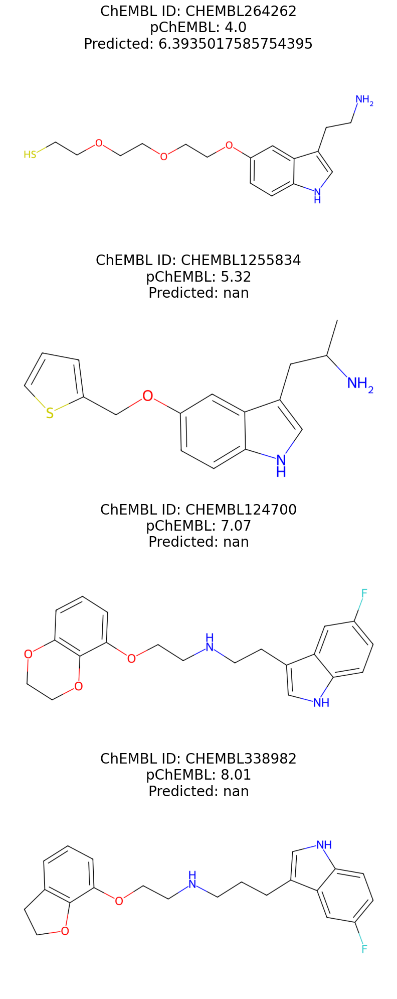

In [70]:
# HEV structure on the top with 3 nearest neighbors bellow
plot_molecule_data(nn_hev_dictio, ev="HEV", dpi=600, save=True)

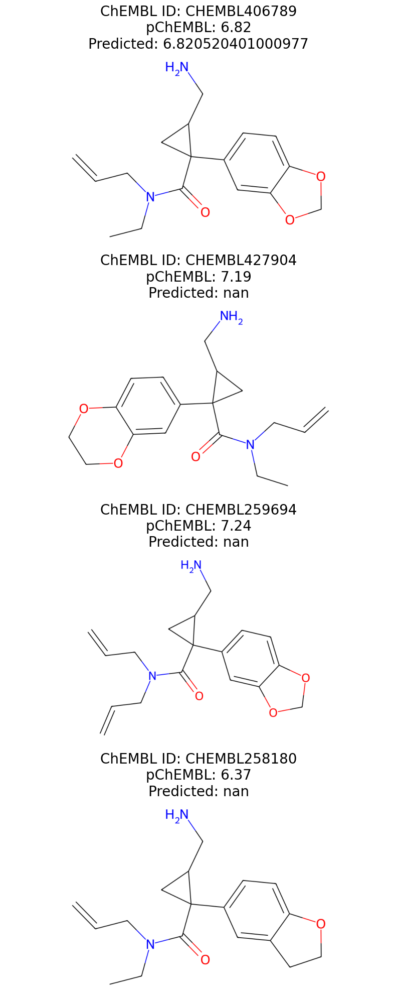

In [71]:
# LEV structure on the top with 3 nearest neighbors bellow
plot_molecule_data(nn_lev_dictio, ev="LEV", dpi=600, save=True)

### Target-based evaluation

The results from 5-fold CV are used to inspect model's performance on individual targets.

In [147]:
import re
from functools import reduce

from evaluation import cv_evaluation_processing, plot_confidence_per_target

In [148]:
# Target specific evaluation processing
cv_r2_df_list = cv_evaluation_processing(just_eval_dict_list_cddd)

In [149]:
# Performance of individual targets with Q² values and confidence intervals
df_values = plot_confidence_per_target(cv_r2_df_list)

In [75]:
# String parsing to extract family names from gene names (target names)


def extract_family(slc_name):
    # Regex to match the desired part: letters followed by numbers
    match = re.match(r"^[A-Za-z]+[0-9]+", slc_name)
    return match.group(0) if match else None


unip_chembl_name_assoc_exch_fam = unip_chembl_name_assoc.copy()
unip_chembl_name_assoc_exch_fam["family"] = unip_chembl_name_assoc_exch_fam[
    "target_name"
].apply(extract_family)

### Performance profile examples

Three targets are selected for individual inspection based on:
- Q² scores
- number of compounds in the dataset
- chemical space

In [76]:
from evaluation import check_target_content, data_content

In [77]:
# Family names are associated to corresponding target names
tabular_df_family = pd.merge(
    tabular_df,
    unip_chembl_name_assoc_exch_fam[["target_name", "family"]],
    on="target_name",
    how="inner",
)

# Counts of compounds per target and family are calcualted
target_counts_df_ucnf = data_content(tabular_df_family, unip_chembl_name_assoc_exch_fam)

In [78]:
# Three targets are chosen for further analysis with 3 distinct performance profiles as a, b, and c

target_a = "SLC5A1"
target_b = "SLC33A1"
target_c = "SLC5A4"

targ_ls = [target_a, target_b, target_c]

# Quantitative and qualitative information is printed for 3 selected targets
check_target_content(target_counts_df_ucnf, targ_ls)

print("")

for tar in targ_ls:
    print(tar, "MTL individual performance: ", df_values[tar].mean().round(3), '  +/-',round(df_values[tar].std(), 3))

SLC5A1 has 975 compounds | Belongs to SLC5 family | Family has 4 members total | Family has 2194 compounds
SLC33A1 has 131 compounds | Belongs to SLC33 family | Family has 1 members total | Family has 131 compounds
SLC5A4 has 28 compounds | Belongs to SLC5 family | Family has 4 members total | Family has 2194 compounds

SLC5A1 MTL individual performance:  0.809   +/- 0.006
SLC33A1 MTL individual performance:  -2.554   +/- 1.548
SLC5A4 MTL individual performance:  0.758   +/- 0.107


### Chemical space analysis

UMAP dimensionality reduction model is used to produce 2D embeddings for visual inspection of the chemical space.

CDDD descriptors are reduced to 2 embeddings.

In [79]:
from evaluation import add_embeddings, dimension_reduction, gen_array

In [80]:
# Isolate the descriptors and convert them into a NumPy array intended for dimensionality reduction.
# SMILES are kept separetly so that the embeddings can be associated with corresponding smiles in the same order.
just_smiles, descriptor_array = gen_array(tabular_df, cddd_matrix)

In [81]:
# Perform the dimensionality reduction by setting an array and chosing the model type.
# The output produces the 2D mbeddings and a reduction model
embeddings, red_model = dimension_reduction(descriptor_array, "umap")

In [82]:
# Concatanate embedings to the smiles and generate a tabular DataFrame with 2D embeddings
nfp_smi_emb = add_embeddings(embeddings, just_smiles, tabular_df_family)

In [83]:
from evaluation import chem_space_scatter_plot

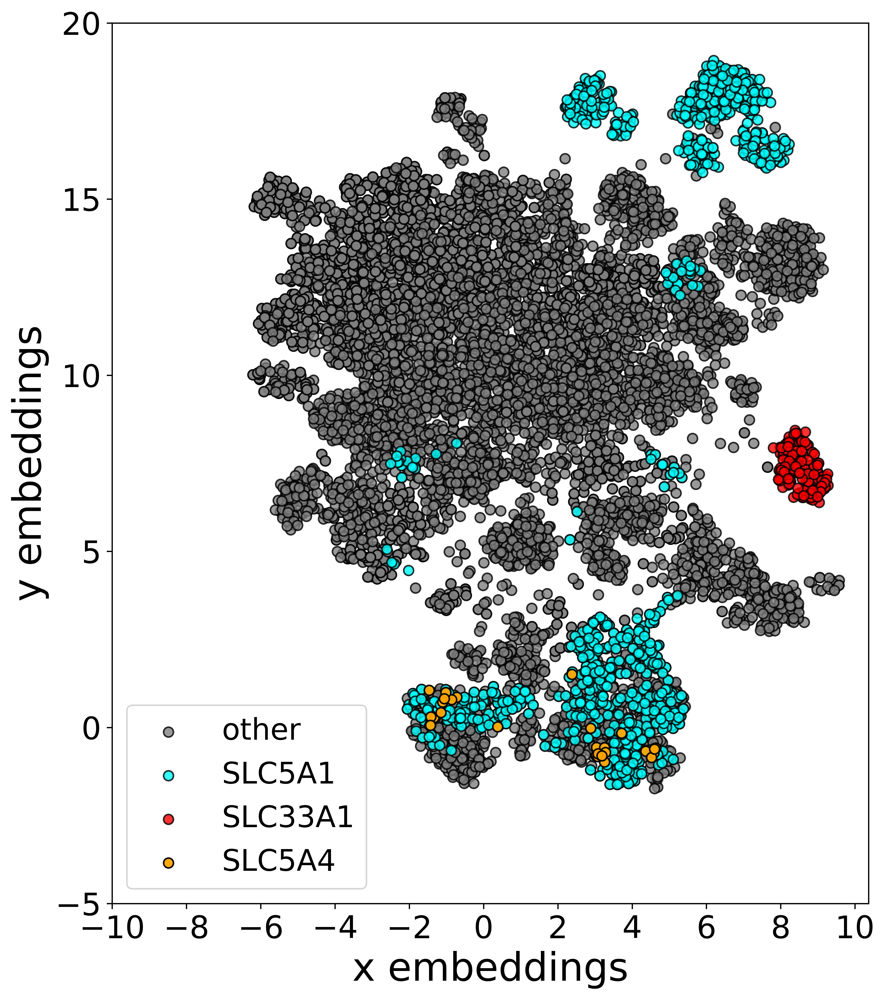

In [84]:
# Function to plot the chemical space
# (reduced dimensionality table is used along with a list of targets that should be color-coded)
chem_space_scatter_plot(nfp_smi_emb, targ_ls)

## Single-task models

Single-task random forest (ST-RF) models are generated and optimized for 3 inspected targets.

This step evaluates the performances of selected targets as standalone data domains with dedicated models.

In [85]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import KFold, cross_val_score, train_test_split

In [91]:
stl_target_name = "SLC5A4" # Select a target for the ST-RF model

In [92]:
# Function that filters the data based on the chosen target string and generates random splits of training, validation, and test data


def single_task_split(df, target):
    target_df = (
        df.dropna(subset=target)
        .drop(columns="new_target_label")
        .sample(frac=1, random_state=seed)
        .reset_index(drop=True)
    )
    X_df = target_df.iloc[:, 1:513]
    X_df[target] = target_df.loc[:, target]
    X_Y_df = X_df

    train, test_temp = train_test_split(X_Y_df, test_size=1 / 3, random_state=seed)
    test, val = train_test_split(test_temp, test_size=0.5, random_state=seed)

    X_train = train.drop(columns=[target])
    y_train = train[target]

    X_test = test.drop(columns=[target])
    y_test = test[target]

    X_val = val.drop(columns=[target])
    y_val = val[target]

    train_val_cv_df = pd.concat([train, val], ignore_index=True, sort=False)

    print(target_df.shape[0])

    return X_train, y_train, X_val, y_val, X_test, y_test, train_val_cv_df


X_train, y_train, X_val, y_val, X_test, y_test, train_val_cv_df = single_task_split(
    cddd_matrix, stl_target_name
)  

28


In [93]:
# Bayesian search of ST-RF hyperparameters
# This step can be skipped because the hyperparameters have already been selected and stored in the cells bellow
def objective(trial, X_train, y_train, X_val, y_val):
    bootstrap = trial.suggest_categorical("bootstrap", [True, False])

    model = RandomForestRegressor(
        n_estimators=trial.suggest_int("n_estimators", 50, 300, step=50),
        max_depth=trial.suggest_int("max_depth", 5, 50, step=5),
        min_samples_split=trial.suggest_int("min_samples_split", 2, 20, step=2),
        min_samples_leaf=trial.suggest_int("min_samples_leaf", 1, 10, step=1),
        max_features=trial.suggest_categorical("max_features", [None, "sqrt", "log2"]),
        bootstrap=bootstrap,
        max_samples=trial.suggest_float("max_samples", 0.5, 1.0) if bootstrap else None,
        random_state=seed,
    )
    model.fit(X_train, y_train)
    y_pred = model.predict(X_val)

    return mean_squared_error(y_val, y_pred)


if run_hyperparameter_optimization:
    study = optuna.create_study(direction="minimize")  # Minimize MSE
    study.optimize(
        lambda trial: objective(trial, X_train, y_train, X_val, y_val), n_trials=300
    )

    print("Best parameters:", study.best_params)

In [94]:
# Chosen parameters for each target

def parameter_selection(stl_target_name):

    if stl_target_name == 'SLC5A1':
        selected_params = {
        "n_estimators": 100,
        "max_depth": 35,
        "min_samples_split": 6,
        "min_samples_leaf": 1,
        "max_features": "sqrt",
        "bootstrap": False,
    }
    elif stl_target_name == 'SLC33A1':
        selected_params = {
        "n_estimators": 150,
        "max_depth": 10,
        "min_samples_split": 4,
        "min_samples_leaf": 1,
        "max_features": "log2",
        "bootstrap": False,
    }
    elif stl_target_name == 'SLC5A4':
        selected_params = {
        "n_estimators": 100,
        "max_depth": 5,
        "min_samples_split": 2,
        "min_samples_leaf": 1,
        "max_features": "log2",
        "bootstrap": False,
    }

    return selected_params

selected_params = parameter_selection(stl_target_name)


In [95]:
# ST-RF model and evaluation


def single_target_model(X_train, y_train, X_test, y_test, best_params):
    best_model = RandomForestRegressor(**best_params, random_state=seed)

    best_model.fit(X_train, y_train)

    # Make predictions
    y_pred = best_model.predict(X_test)

    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    print(f"Mean Squared Error: {mse:.4f}")
    print(f"R-squared Score: {r2:.4f}")


#single_target_model(X_train, y_train, X_test, y_test, selected_params)

In [96]:
# ST-RF cross-validation


def single_target_cv(df, target, best_params, cv_folds=5):
    X_train = df.iloc[:, :512]
    y_train = df.loc[:, target]

    best_model = RandomForestRegressor(**best_params, random_state=seed)

    kf = KFold(n_splits=cv_folds, shuffle=True, random_state=seed)
    cv_mse = cross_val_score(
        best_model, X_train, y_train, cv=kf, scoring="neg_mean_squared_error"
    )
    cv_r2 = cross_val_score(best_model, X_train, y_train, cv=kf, scoring="r2")

    print(f"Cross-Validation MSE: {np.mean(-cv_mse):.4f} \u00b1 {np.std(-cv_mse):.4f}")
    print(f"Cross-Validation R2: {np.mean(cv_r2):.4f} \u00b1 {np.std(cv_r2):.4f}")

    return cv_r2


single_target_cv(train_val_cv_df, stl_target_name, selected_params, cv_folds=5)

Cross-Validation MSE: 0.2351 ± 0.1029
Cross-Validation R2: 0.6095 ± 0.2104


array([0.9267986 , 0.39639534, 0.71439042, 0.35935811, 0.65047176])

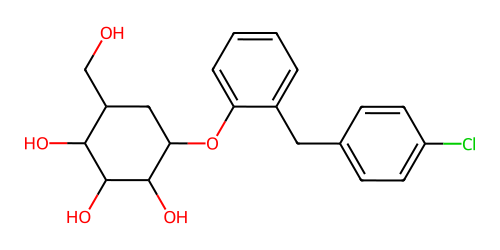

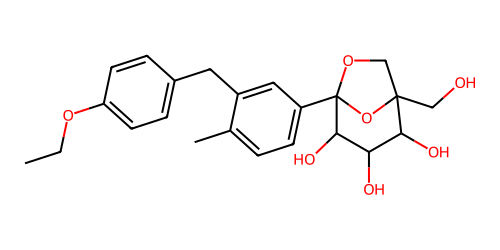

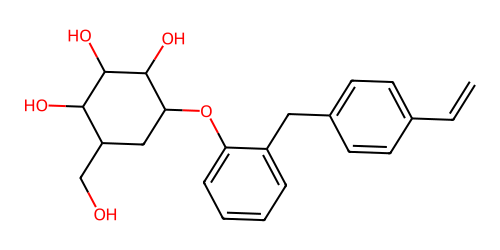

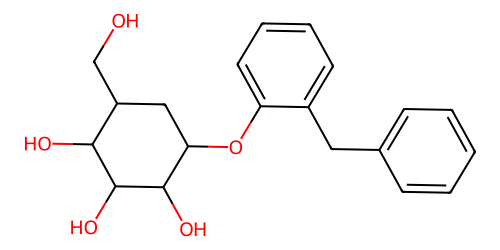

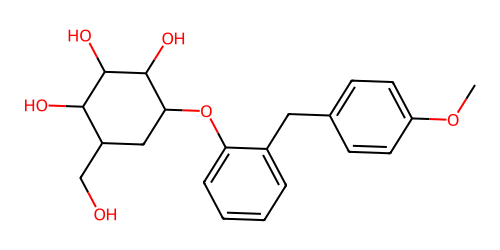

In [97]:
from evaluation import draw_molecule_from_smiles, take_compound_sample_targ

dict_of_comp_lists = take_compound_sample_targ(tabular_df, targ_ls, 30)

# Example usage
for smiles in dict_of_comp_lists[stl_target_name]:
    draw_molecule_from_smiles(smiles)